# Chicago Micromobility Demand & Stations Analysis
**Mari Bolton**<br>
October 2019

#### References
- Google Maps: http://maps.google.com
- Chicago Divvy Bikes: https://www.divvybikes.com
- Divvy Bike Speed: http://www.stevencanplan.com/2013/06/my-experience-with-divvy-today-smooth-and-slow/
- Chicago Open Data: https://www.transitchicago.com/data/

# Data Prep & Exploration

## Import Python Packages

In [1]:
# Importing Packages
import datetime
import pandas as pd
import numpy as np
from IPython.display import display, HTML, Image
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import geopandas as gpd
from shapely.geometry import Point, MultiPolygon
import descartes
import keplergl
from keplergl import KeplerGl
%matplotlib inline

### Locate & Ingest Data

In [2]:
# Setting the folder location
folder_ipynb = '/mnt/c/Users/marzziippan/git/micromobility/chicago/demand_stations/'
folder_data = '/mnt/c/Users/marzziippan/git/micromobility/chicago/demand_stations/data/'
folder_images = '/mnt/c/Users/marzziippan/git/micromobility/chicago/demand_stations/images/'
folder_maps = '/mnt/c/Users/marzziippan/git/micromobility/chicago/demand_stations/maps/'
folder_tableau = '/mnt/c/Users/marzziippan/git/micromobility/chicago/demand_stations/tableau/'

#### Data Descriptions
- Trips: This contains trip level data, with some associated customer information.
- Stations: This contains geographical data, detailing where docks are located.
- Weather: This contains daily weather information for cities in which trips took place (from www.ncdc.noaa.gov).

In [3]:
# Ingest the .csv file(s) for Pandas
df_trips = pd.read_csv(folder_data + 'Trips_OA_case.csv')
df_stations = pd.read_csv(folder_data + 'Stations_OA_case.csv')
df_weather = pd.read_csv(folder_data + 'Weather_OA_case.csv')

### Trips

In [4]:
# Trips: Descriptive Statistics, Sample Rows
print(df_trips.describe())
display(df_trips.head(5))

             trip_id        bike_id  tripduration  from_station_id  \
count  365069.000000  365069.000000  3.650690e+05    365069.000000   
mean   182535.000000    3429.484607  1.016342e+03       198.088816   
std    105386.487049    1923.321025  2.791351e+04       153.493553   
min         1.000000       1.000000  6.100000e+01         2.000000   
25%     91268.000000    1777.000000  3.260000e+02        76.000000   
50%    182535.000000    3489.000000  5.240000e+02       170.000000   
75%    273802.000000    5157.000000  8.660000e+02       287.000000   
max    365069.000000    6471.000000  1.062840e+07       665.000000   

       to_station_id      birthyear  
count  365069.000000  347048.000000  
mean      198.581123    1981.673250  
std       154.468304      11.250314  
min         2.000000    1860.000000  
25%        76.000000    1975.000000  
50%       168.000000    1985.000000  
75%       287.000000    1990.000000  
max       665.000000    2003.000000  


,trip_id,start_time,end_time,bike_id,tripduration,from_station_id,to_station_id,usertype,gender,birthyear
0,1,1/1/19 0:04,1/1/19 0:11,2167,390,199,84,Subscriber,Male,1989.0
1,2,1/1/19 0:08,1/1/19 0:15,4386,441,44,624,Subscriber,Female,1990.0
2,3,1/1/19 0:13,1/1/19 0:27,1524,829,15,644,Subscriber,Female,1994.0
3,4,1/1/19 0:13,1/1/19 0:43,252,1783,123,176,Subscriber,Male,1993.0
4,5,1/1/19 0:14,1/1/19 0:20,1170,364,173,35,Subscriber,Male,1994.0


In [5]:
# Trips: tripd_id Primary Key, Number of Trips
df_trips.trip_id.nunique()

365069

In [6]:
# Trips: Dimensions, Bikes
print('Bike Count: ',df_trips.bike_id.nunique())

Bike Count:  4769


In [7]:
# Trips: Dimensions, From Stations
print('From Stations: ',df_trips.from_station_id.nunique())
#print('From Stations: ',df_trips.from_station_id.unique())

From Stations:  594


In [8]:
# Trips: Dimensions, To Stations
print('To Stations: ',df_trips.to_station_id.nunique())
#print('To Stations: ',df_trips.to_station_id.unique())

To Stations:  600


In [9]:
array_trips_from_stations = df_trips.from_station_id.unique()
array_trips_to_stations = df_trips.to_station_id.unique()

In [10]:
np.setdiff1d(array_trips_from_stations, array_trips_to_stations)

array([536, 538, 555])

In [11]:
np.setdiff1d(array_trips_to_stations, array_trips_from_stations)

array([361, 386, 560, 564, 569, 575, 581, 593, 642])

#### Observation
There are more from stations than to stations, 600 versus 594.
- **Observed from the dataset: riders travel from stations 536, 538, and 555 but not to them.**
- **Observed from the dataset: riders travel to stations 361, 386, 560, 564, 569, 575, 581, 593, 642 but not from them.**

In [12]:
# Calculating bikes per station
print(df_trips.bike_id.nunique()/df_trips.to_station_id.nunique())

7.948333333333333


#### Observation
There are roughly 7.9483 bikes per station.

In [13]:
# Trips: Dimensions, User Type
print('From Stations: ',df_trips.usertype.nunique())
print('From Stations: ',df_trips.usertype.unique())

From Stations:  2
From Stations:  ['Subscriber' 'Customer']


#### Information from Data Dictionary
- If Subscriber, member’s gender (Male or Female) noted<br>
- If Subscriber, member’s year of birth noted

In [14]:
# Trips: Dimensions, Birth Year

# This Year
thisyear = datetime.datetime.now().year
print("Current Year: ", thisyear)

# Inserting new column age
df_trips.insert(len(df_trips.columns), 'age', thisyear - df_trips.birthyear)
df_trips.age.describe()

Current Year:  2021


count    347048.000000
mean         39.326750
std          11.250314
min          18.000000
25%          31.000000
50%          36.000000
75%          46.000000
max         161.000000
Name: age, dtype: float64

Number Birth Years:  75


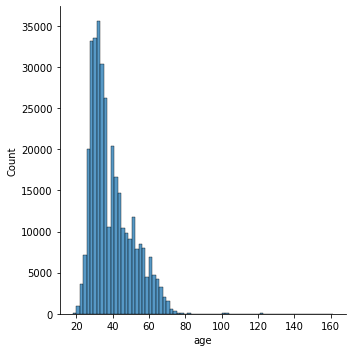

In [16]:
# Ages
print('Number Birth Years: ',df_trips.age.nunique())
sns.displot(df_trips.age, bins=df_trips.age.nunique(), kde=False, rug=False)

In [17]:
# Investigating riders > 100 years in age
df_age_100_plus = df_trips.copy()
df_age_100_plus = df_age_100_plus.loc[(df_age_100_plus.age > 100)]

print("Number Records Where Age > 100 Years: ",len(df_age_100_plus))
display(df_age_100_plus.head(10))

Number Records Where Age > 100 Years:  115


,trip_id,start_time,end_time,bike_id,tripduration,from_station_id,to_station_id,usertype,gender,birthyear,age
6351,6352,1/3/19 8:02,1/3/19 8:08,4953,344,219,61,Subscriber,Male,1918.0,103.0
6423,6424,1/3/19 8:09,1/3/19 8:29,6229,1195,61,49,Subscriber,Male,1918.0,103.0
10517,10518,1/3/19 19:03,1/3/19 19:28,668,1533,283,219,Subscriber,Male,1918.0,103.0
10682,10683,1/3/19 19:36,1/3/19 19:51,668,892,219,219,Subscriber,Male,1918.0,103.0
12038,12039,1/4/19 8:03,1/4/19 8:25,5341,1316,58,49,Subscriber,Male,1918.0,103.0
13196,13197,1/4/19 10:58,1/4/19 11:17,1445,1126,213,91,Subscriber,Male,1900.0,121.0
14737,14738,1/4/19 15:40,1/4/19 16:27,1159,2862,94,35,Customer,NaN,1901.0,120.0
16317,16318,1/4/19 17:30,1/4/19 17:56,3589,1512,37,219,Subscriber,Male,1918.0,103.0
17298,17299,1/4/19 19:20,1/4/19 19:26,2142,360,601,663,Subscriber,Male,1860.0,161.0
17551,17552,1/4/19 20:24,1/4/19 20:48,848,1448,18,156,Subscriber,Male,1900.0,121.0


In [18]:
# Grouping by usertype and age and getting trip counts
df_age_100_plus.groupby(['usertype','age'])['trip_id'].count()

usertype    age  
Customer    120.0     2
            121.0     2
Subscriber  103.0    40
            121.0    69
            133.0     1
            161.0     1
Name: trip_id, dtype: int64

In [19]:
# Calculating the percent of outliers out of total
print(round((len(df_age_100_plus)/df_trips.trip_id.nunique())*100,4),'%')

0.0315 %


#### Observation
Out of the 365069 trips, 115 have ages > 100 years old. Of these, 111 are usertype = Subscriber and 4 are usertype = Customer. These 115 trips out of 365069 represent 0.0315% of all trips in the dataset.<br>
#### Data Discrepancy Callout
Based on Chicago age data (https://censusreporter.org/profiles/16000US1714000-chicago-il/) only 3% of the population are 80+ in age (years). It is possible that there are riders 100+ in age; however, the fact that the two largest age buckets > 100 are 101 and 119 indicate that there are arising with how the birthyear field gets populated. The other outliers of ages 131 and 159 could have arisen from usertype = Subscribers inputting incorrect birth years upon account creation/update.<br><br>
**Decision Point: Will remove the 115 records from the dataset.**

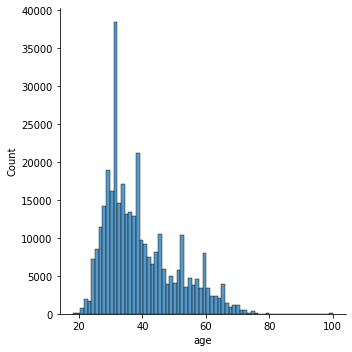

In [21]:
# Selecting a dataset where age is <= 100 years
df_trips_valid_ages = df_trips.loc[(df_trips.age <= 100)]

# Histogram
sns.displot(df_trips_valid_ages.age, bins=df_trips_valid_ages.age.nunique(), kde=False, rug=False)

#### Information from Data Diciontary
tripduration is in seconds.

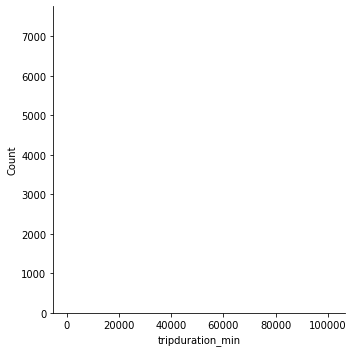

In [34]:
# Creating a copy of the dataset, and adding a new column tripduration in minutes
df_trips_s1 = df_trips_valid_ages.copy()
df_trips_s1['tripduration_min'] = df_trips_s1.apply(lambda x: x['tripduration'] if x['tripduration'] < 1 else x['tripduration']/60, axis=1)

# Histogram
sns.displot(df_trips_s1.tripduration_min, kde=False, rug=False)

#### Assumptions
##### MSC Bike Specs
- Question: What type of bikes does MSC use?
- Assumption: MSC uses non-electric powered bikes with average speeds of 10-15 miles per hour, or 16 to 24 kilometers per hour; this can be modified once more bike information is available.

##### MSC Geographical Boundaries
- Question: What square miles/kilometers do bikes ride within?
- Assumption: Docked and dockless bike share services in Chicago are confined to the same geographical boundaries of Chicago, this applies to MSC.
- Assumption: The boundaries in which the MSC can operate is the full 234 square miles, or 606 square kilometers of Chicago.

##### MSC Longest Bike Route
- Question: What is the longest possible route a bike could ride within Chicago bike share boundaries?
- Assumption: The longest possible route is directionally north/south with an example route being from Cheltenham to Evanston, which is 26 miles and takes 2 hours and 16 minutes to bike (Google Maps).
https://www.google.com/maps/dir/Cheltenham,+Chicago,+IL+60617/Evanston,+IL/@41.8958079,-87.7651558,11z/data=!4m14!4m13!1m5!1m1!1s0x880e286cee314d11:0x7d1557cf71bb9714!2m2!1d-87.5611574!2d41.7480905!1m5!1m1!1s0x880fcffd34e80a77:0x6f21a10d05c0671a!2m2!1d-87.6876969!2d42.0450722!3e2
- Assumption: MSC bike rentals allow for idle time, in which the rider can leave the bike and stop to sightsee, run errands, take bathroom breaks, etc.
- Assumption: The maximum valid time that an MSC bike can be engaged in a trip is 3 hours, or 180 minutes.
- Assumption: Trips with duration longer than 3 hours are invalid data points in which the trip was stale, i.e., the rider left the bike without ending the trip in the app (or other method of ending the trip, phone call, canceled trip, etc.).

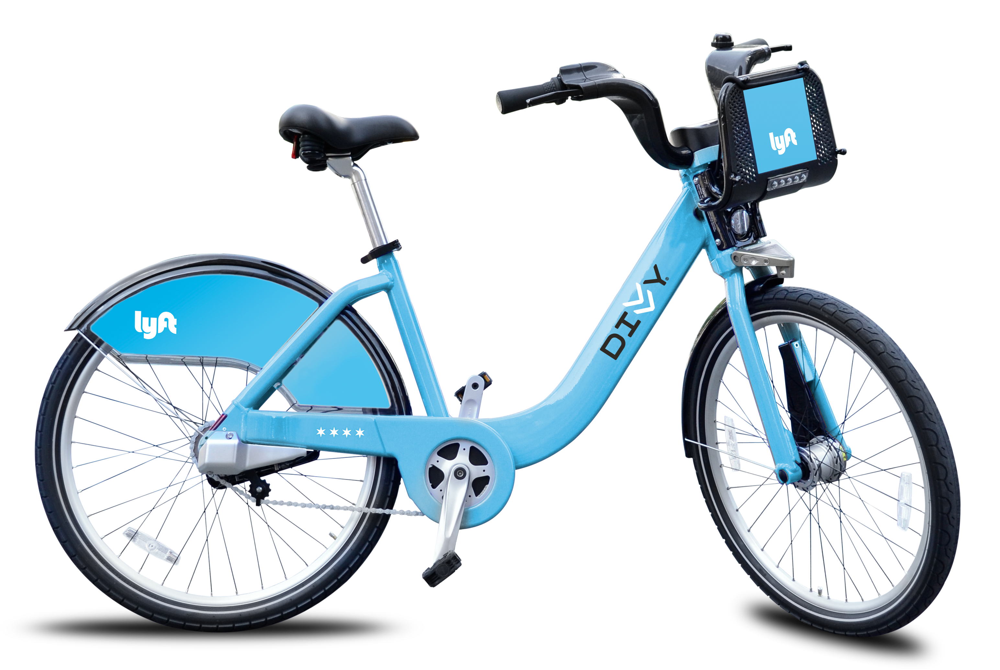

In [35]:
# Image of vehicle that MSC might be using
Image(filename = folder_images + 'Divvy-Bike_new_0119_v3.png', width = 400)

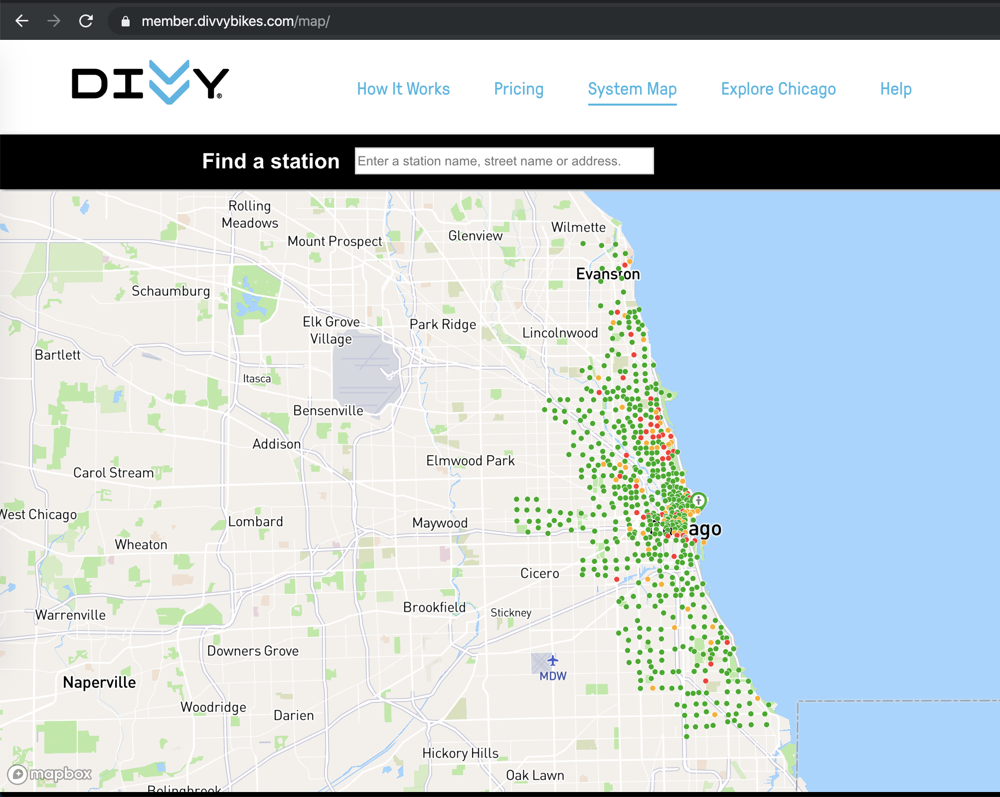

In [36]:
# Sample map of bike locations for a company similar to MSC; however, might be dockless vs. docked
Image(filename = folder_images + 'divvybikes_map_2019_10_19.png', width = 800)

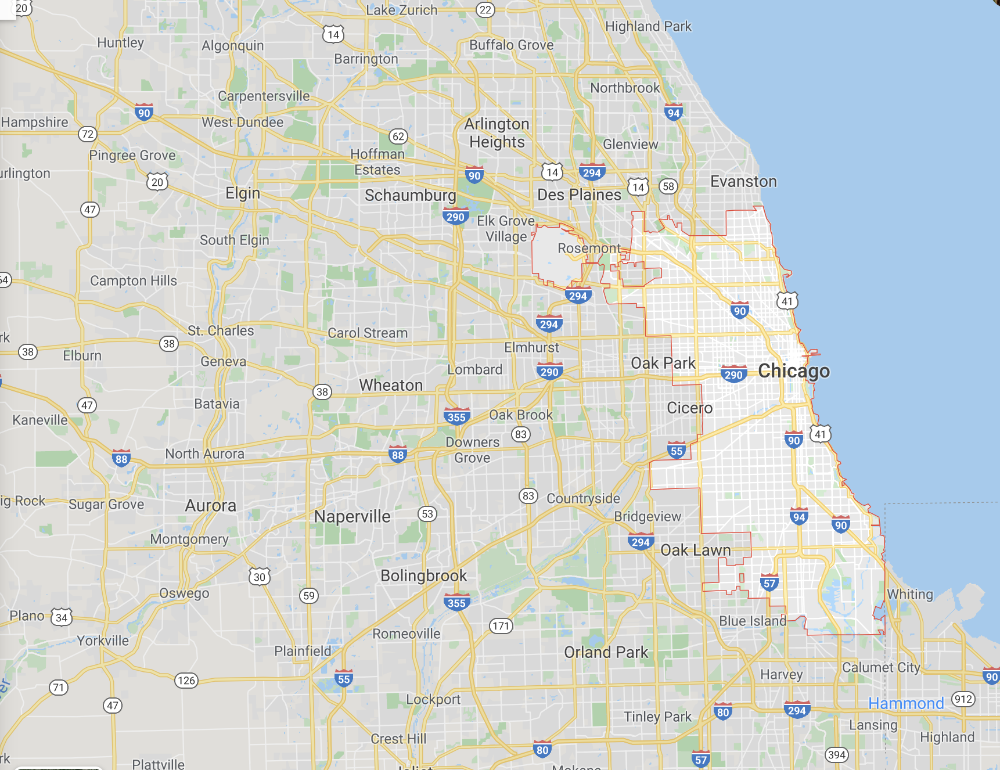

In [37]:
# Map of Chicago city boundaries
Image(filename = folder_images + 'google_maps_chicago.png', width = 800)

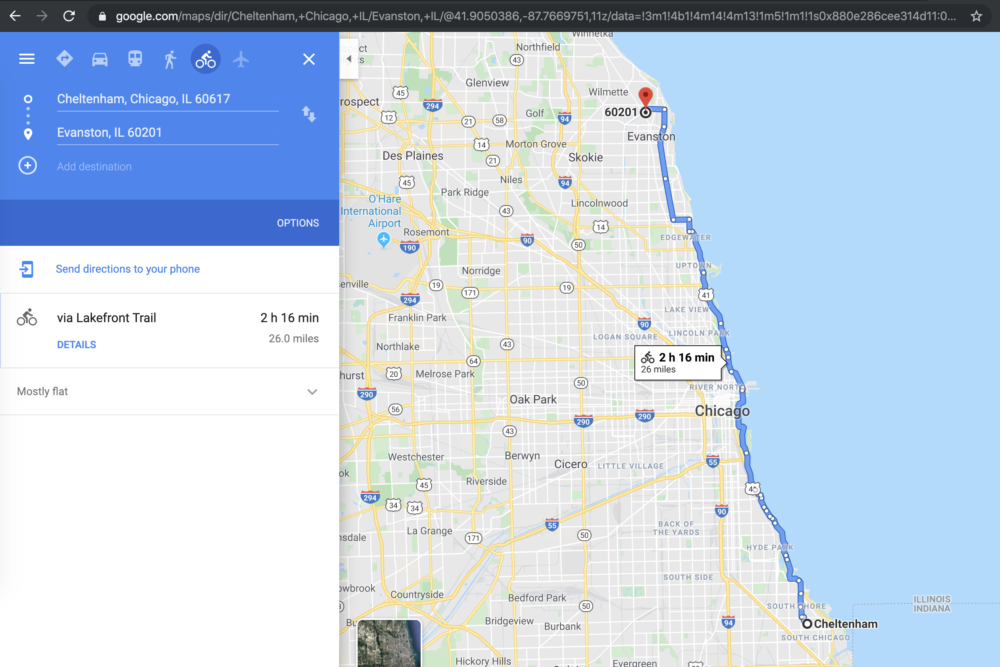

In [38]:
# Map of longest route within Chicago boundaries
Image(filename = folder_images + 'google_maps_longest_route.png', width = 800)

In [39]:
# Investigating tripduration in minutes > 180 minutes
df_min_180_plus = df_trips_s1.copy()
df_min_180_plus = df_min_180_plus.loc[(df_min_180_plus.tripduration_min > 180)]

print("Number Records Where Duration > 180 Minutes: ",len(df_min_180_plus))
display(df_min_180_plus.head(10))

Number Records Where Duration > 180 Minutes:  534


,trip_id,start_time,end_time,bike_id,tripduration,from_station_id,to_station_id,usertype,gender,birthyear,age,tripduration_min
100,101,1/1/19 2:21,1/2/19 9:35,2048,112466,69,67,Customer,Male,1994.0,27.0,1874.433333
311,312,1/1/19 10:22,1/2/19 10:08,1164,85554,43,43,Subscriber,Male,1977.0,44.0,1425.900000
2416,2417,1/2/19 8:34,1/2/19 17:15,4318,31292,188,188,Subscriber,Male,1990.0,31.0,521.533333
3067,3068,1/2/19 11:35,1/2/19 14:38,3391,10955,197,198,Customer,Male,1993.0,28.0,182.583333
3198,3199,1/2/19 12:29,1/2/19 19:44,3942,26115,81,110,Subscriber,Male,1992.0,29.0,435.250000
3448,3449,1/2/19 14:14,1/2/19 17:43,1164,12559,43,43,Customer,Male,1992.0,29.0,209.316667
4696,4697,1/2/19 17:58,1/3/19 8:47,3969,53326,67,67,Subscriber,Male,1982.0,39.0,888.766667
7355,7356,1/3/19 11:10,1/3/19 21:02,4841,35541,110,337,Subscriber,Male,1992.0,29.0,592.350000
7484,7485,1/3/19 11:44,1/3/19 17:10,1531,19527,229,664,Subscriber,Female,1991.0,30.0,325.450000
10132,10133,1/3/19 18:10,1/4/19 14:00,4976,71380,67,67,Subscriber,Male,1982.0,39.0,1189.666667


In [40]:
# Grouping by tripduration in hours and getting trip counts
df_min_180_plus['tripduration_hr'] = df_min_180_plus.apply(lambda x: x['tripduration_min'] if x['tripduration_min'] < 1 else round(x['tripduration_min']/60,0), axis=1)
df_min_180_plus.groupby(['tripduration_hr'])['trip_id'].count()

tripduration_hr
3.0       65
4.0       71
5.0       46
6.0       29
7.0       20
          ..
720.0      1
860.0      1
1091.0     1
1568.0     1
1693.0     1
Name: trip_id, Length: 85, dtype: int64

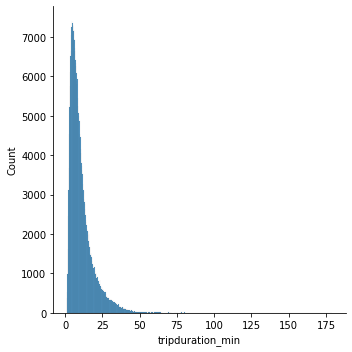

In [47]:
# Subset where tripduration in minutes is <= 180 minutes
df_trips_s2 = df_trips_s1.loc[(df_trips_s1.tripduration_min <= 180)]

# Histogram
sns.displot(df_trips_s2.tripduration_min, rug=False);

<AxesSubplot:xlabel='tripduration_min', ylabel='Count'>

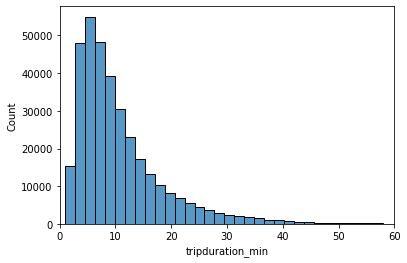

In [48]:
# Histogram, tripduration minutes from 0 to 60 minutes
plt.xlim(0, 60)
sns.histplot(df_trips_s2.tripduration_min, bins = 100)

In [49]:
# Calculating the percent of records remaining after removing outliers
print(round((len(df_trips_s2)/df_trips.trip_id.nunique())*100,4),'%')

94.8859 %


#### Observation
Out of the 365069 trips, when limiting to trips where age is <= 100 years **and** trip duration in minutes is <= 180 minutes, we are left with 94.8859% of the dataset.<br>
#### Data Discrepancy Callout
There are 534 out of 365069 records, or 0.1463%, in which the trip duration is longer than 180 minutes. Some of these outliers even go beyond 24 hours. This could indicate theft / foul play, a faulty component which is responsible for recording the trip duration on specific bikes, or an issue with the source code in how it calculates trip duration, etc. Although the problem is relatively small now, it needs be investigated and addressed.<br><br>
**Decision Point: Will move forward with the 94.8859% of total records cleaned dataset**

### Stations

In [50]:
# Stations: Descriptive Statistics, Sample Rows
print(df_stations.describe())
display(df_stations.head())

       station_id    latitude   longitude  station_capacity
count  585.000000  585.000000  585.000000        585.000000
mean   317.312821   41.887417  -87.658172         17.463248
std    181.022135    0.067122    0.043398          6.747838
min      2.000000   41.736646  -87.803911          0.000000
25%    163.000000   41.851375  -87.679459         15.000000
50%    315.000000   41.886923  -87.653833         15.000000
75%    475.000000   41.931320  -87.630834         19.000000
max    626.000000   42.064313  -87.549386         55.000000


,station_id,station_name,station_city,latitude,longitude,station_capacity
0,2,Buckingham Fountain,Chicago,41.876393,-87.620328,27
1,3,Shedd Aquarium,Chicago,41.867226,-87.615355,55
2,4,Burnham Harbor,Chicago,41.856268,-87.613348,23
3,5,State St & Harrison St,Chicago,41.874053,-87.627716,23
4,6,Dusable Harbor,Chicago,41.885041,-87.612794,39


#### Assumption
df_stations.station_id corresponds to df_trips.to_station_id and df_trips.from_station_id.

In [51]:
# Creating a copy of the stations dataset with field names appended
df_stations_to = df_stations.copy()
df_stations_to.columns = ['to_' + str(col) for col in df_stations_to.columns]

display(df_stations_to.head(2))

,to_station_id,to_station_name,to_station_city,to_latitude,to_longitude,to_station_capacity
0,2,Buckingham Fountain,Chicago,41.876393,-87.620328,27
1,3,Shedd Aquarium,Chicago,41.867226,-87.615355,55


In [52]:
# Creating a copy of the stations dataset with field names appended
df_stations_from = df_stations.copy()
df_stations_from.columns = ['from_' + str(col) for col in df_stations_from.columns]
display(df_stations_from.head(2))

,from_station_id,from_station_name,from_station_city,from_latitude,from_longitude,from_station_capacity
0,2,Buckingham Fountain,Chicago,41.876393,-87.620328,27
1,3,Shedd Aquarium,Chicago,41.867226,-87.615355,55


In [53]:
# Dataset with station information joined
df_trips_stations = pd.merge(df_trips_s2, df_stations_to, on='to_station_id', how='left')
df_trips_stations = pd.merge(df_trips_stations, df_stations_from, on='from_station_id', how='left')
display(df_trips_stations)

,trip_id,start_time,end_time,bike_id,tripduration,from_station_id,to_station_id,usertype,gender,birthyear,...,to_station_name,to_station_city,to_latitude,to_longitude,to_station_capacity,from_station_name,from_station_city,from_latitude,from_longitude,from_station_capacity
0,1,1/1/19 0:04,1/1/19 0:11,2167,390,199,84,Subscriber,Male,1989.0,...,Milwaukee Ave & Grand Ave,Chicago,41.891578,-87.648384,19.0,Wabash Ave & Grand Ave,Chicago,41.891466,-87.626761,31.0
1,2,1/1/19 0:08,1/1/19 0:15,4386,441,44,624,Subscriber,Female,1990.0,...,Dearborn St & Van Buren St (*),Chicago,41.876268,-87.629155,16.0,State St & Randolph St,Chicago,41.884730,-87.627734,27.0
2,3,1/1/19 0:13,1/1/19 0:27,1524,829,15,644,Subscriber,Female,1994.0,...,NaN,NaN,NaN,NaN,NaN,Racine Ave & 18th St,Chicago,41.858166,-87.656495,15.0
3,4,1/1/19 0:13,1/1/19 0:43,252,1783,123,176,Subscriber,Male,1993.0,...,Clark St & Elm St,Chicago,41.902973,-87.631280,27.0,California Ave & Milwaukee Ave,Chicago,41.922695,-87.697153,15.0
4,5,1/1/19 0:14,1/1/19 0:20,1170,364,173,35,Subscriber,Male,1994.0,...,Streeter Dr & Grand Ave,Chicago,41.892278,-87.612043,47.0,Mies van der Rohe Way & Chicago Ave,Chicago,41.896910,-87.621743,15.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346394,365065,3/31/19 23:51,4/1/19 0:04,1501,757,38,29,Subscriber,Male,1993.0,...,Noble St & Milwaukee Ave,Chicago,41.900680,-87.662600,15.0,Clark St & Lake St,Chicago,41.886021,-87.630876,27.0
346395,365066,3/31/19 23:52,3/31/19 23:58,3270,332,129,202,Subscriber,Male,1992.0,...,Halsted St & 18th St,Chicago,41.857499,-87.646277,15.0,Blue Island Ave & 18th St,Chicago,41.857556,-87.661535,15.0
346396,365067,3/31/19 23:52,4/1/19 0:06,3584,846,283,273,Subscriber,Male,1984.0,...,Michigan Ave & 18th St,Chicago,41.857813,-87.624550,23.0,LaSalle St & Jackson Blvd,Chicago,41.878170,-87.631985,35.0
346397,365068,3/31/19 23:53,3/31/19 23:56,4384,178,321,39,Subscriber,Male,1969.0,...,Wabash Ave & Adams St,Chicago,41.879472,-87.625689,23.0,Wabash Ave & 9th St,Chicago,41.870769,-87.625734,19.0


In [54]:
# Ensuring no record duplications
print(len(df_trips_stations))

346399


#### Assumption
Station information such as station name, latitude, longitude, and capacity are up-to-date and accurate.

### Weather

In [55]:
# Weather: Descriptive Statistics, Sample Rows
print(df_weather.describe())
display(df_weather.head(5))

       precipitation     snowfall    temp_max    temp_min  temp_observed
count     270.000000   270.000000  270.000000  270.000000     270.000000
mean        0.094648   296.596296   35.366667   18.914815      25.433333
std         0.191255  1698.554592   12.769140   13.700872      13.822333
min         0.000000     0.000000  -10.000000  -23.000000     -20.000000
25%         0.000000     0.000000   29.000000   10.000000      18.000000
50%         0.000000     0.000000   35.000000   24.000000      28.000000
75%         0.060000     0.050000   45.000000   27.000000      34.000000
max         0.780000  9999.000000   68.000000   44.000000      58.000000


,weather_station,city,date,precipitation,snowfall,temp_max,temp_min,temp_observed
0,USC00111497,Chicago,1/1/19,0.78,0.0,38,28,29
1,USC00111497,Chicago,1/2/19,0.00,0.0,30,25,29
2,USC00111497,Chicago,1/3/19,0.00,0.0,30,24,25
3,USC00111497,Chicago,1/4/19,0.00,0.0,41,24,32
4,USC00111497,Chicago,1/5/19,0.00,0.0,50,27,31


#### Assumption
df_weather.date can be joined to df_trips.start_time to obtain the weather at the start time of a trip.

In [56]:
# Adding start_date as date
df_weather = df_weather.rename({'date': 'start_date'}, axis='columns')
df_weather['start_date'] = pd.to_datetime(df_weather['start_date'])
display(df_weather.head())

,weather_station,city,start_date,precipitation,snowfall,temp_max,temp_min,temp_observed
0,USC00111497,Chicago,2019-01-01,0.78,0.0,38,28,29
1,USC00111497,Chicago,2019-01-02,0.00,0.0,30,25,29
2,USC00111497,Chicago,2019-01-03,0.00,0.0,30,24,25
3,USC00111497,Chicago,2019-01-04,0.00,0.0,41,24,32
4,USC00111497,Chicago,2019-01-05,0.00,0.0,50,27,31


In [57]:
print(df_weather.city.unique())

['Chicago' 'Evanston' 'Oak Park']


#### Assumption
Weather from Chicago approximates weather for all bike trips.

In [58]:
df_weather_chicago = df_weather.loc[(df_weather.city == 'Chicago')]
print(df_weather_chicago.head())

  weather_station     city start_date  precipitation  snowfall  temp_max  \
0     USC00111497  Chicago 2019-01-01           0.78       0.0        38   
1     USC00111497  Chicago 2019-01-02           0.00       0.0        30   
2     USC00111497  Chicago 2019-01-03           0.00       0.0        30   
3     USC00111497  Chicago 2019-01-04           0.00       0.0        41   
4     USC00111497  Chicago 2019-01-05           0.00       0.0        50   

   temp_min  temp_observed  
0        28             29  
1        25             29  
2        24             25  
3        24             32  
4        27             31  


In [59]:
# Adding start_date as date
df_trips_stations.insert(len(df_trips_stations.columns), 'start_date', pd.to_datetime(df_trips_stations.start_time, errors='coerce'))
df_trips_stations.start_date = df_trips_stations.start_date.dt.floor('d')
print(len(df_trips_stations))
display(df_trips_stations.head())

346399


,trip_id,start_time,end_time,bike_id,tripduration,from_station_id,to_station_id,usertype,gender,birthyear,...,to_station_city,to_latitude,to_longitude,to_station_capacity,from_station_name,from_station_city,from_latitude,from_longitude,from_station_capacity,start_date
0,1,1/1/19 0:04,1/1/19 0:11,2167,390,199,84,Subscriber,Male,1989.0,...,Chicago,41.891578,-87.648384,19.0,Wabash Ave & Grand Ave,Chicago,41.891466,-87.626761,31.0,2019-01-01
1,2,1/1/19 0:08,1/1/19 0:15,4386,441,44,624,Subscriber,Female,1990.0,...,Chicago,41.876268,-87.629155,16.0,State St & Randolph St,Chicago,41.884730,-87.627734,27.0,2019-01-01
2,3,1/1/19 0:13,1/1/19 0:27,1524,829,15,644,Subscriber,Female,1994.0,...,NaN,NaN,NaN,NaN,Racine Ave & 18th St,Chicago,41.858166,-87.656495,15.0,2019-01-01
3,4,1/1/19 0:13,1/1/19 0:43,252,1783,123,176,Subscriber,Male,1993.0,...,Chicago,41.902973,-87.631280,27.0,California Ave & Milwaukee Ave,Chicago,41.922695,-87.697153,15.0,2019-01-01
4,5,1/1/19 0:14,1/1/19 0:20,1170,364,173,35,Subscriber,Male,1994.0,...,Chicago,41.892278,-87.612043,47.0,Mies van der Rohe Way & Chicago Ave,Chicago,41.896910,-87.621743,15.0,2019-01-01


In [60]:
# Dataset with weather information joined
df_trips_stations_weather = pd.merge(df_trips_stations, df_weather_chicago, on='start_date', how='left')
display(df_trips_stations_weather)

,trip_id,start_time,end_time,bike_id,tripduration,from_station_id,to_station_id,usertype,gender,birthyear,...,from_longitude,from_station_capacity,start_date,weather_station,city,precipitation,snowfall,temp_max,temp_min,temp_observed
0,1,1/1/19 0:04,1/1/19 0:11,2167,390,199,84,Subscriber,Male,1989.0,...,-87.626761,31.0,2019-01-01,USC00111497,Chicago,0.78,0.0,38,28,29
1,2,1/1/19 0:08,1/1/19 0:15,4386,441,44,624,Subscriber,Female,1990.0,...,-87.627734,27.0,2019-01-01,USC00111497,Chicago,0.78,0.0,38,28,29
2,3,1/1/19 0:13,1/1/19 0:27,1524,829,15,644,Subscriber,Female,1994.0,...,-87.656495,15.0,2019-01-01,USC00111497,Chicago,0.78,0.0,38,28,29
3,4,1/1/19 0:13,1/1/19 0:43,252,1783,123,176,Subscriber,Male,1993.0,...,-87.697153,15.0,2019-01-01,USC00111497,Chicago,0.78,0.0,38,28,29
4,5,1/1/19 0:14,1/1/19 0:20,1170,364,173,35,Subscriber,Male,1994.0,...,-87.621743,15.0,2019-01-01,USC00111497,Chicago,0.78,0.0,38,28,29
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
346394,365065,3/31/19 23:51,4/1/19 0:04,1501,757,38,29,Subscriber,Male,1993.0,...,-87.630876,27.0,2019-03-31,USC00111497,Chicago,0.02,0.1,43,23,26
346395,365066,3/31/19 23:52,3/31/19 23:58,3270,332,129,202,Subscriber,Male,1992.0,...,-87.661535,15.0,2019-03-31,USC00111497,Chicago,0.02,0.1,43,23,26
346396,365067,3/31/19 23:52,4/1/19 0:06,3584,846,283,273,Subscriber,Male,1984.0,...,-87.631985,35.0,2019-03-31,USC00111497,Chicago,0.02,0.1,43,23,26
346397,365068,3/31/19 23:53,3/31/19 23:56,4384,178,321,39,Subscriber,Male,1969.0,...,-87.625734,19.0,2019-03-31,USC00111497,Chicago,0.02,0.1,43,23,26


In [61]:
# Ensuring no record duplications
print(len(df_trips_stations_weather))

346399


In [63]:
# Create geometry points for Kepler.gl mapping in case need them
geometry_1 = [Point(xy) for xy in zip(df_trips_stations_weather['from_longitude'], df_trips_stations_weather['from_latitude'])]

# Specifying CRS
crs = "EPSG:4326"
# crs = {'init':'epss:4326'} ## deprecated

# Creating the GeoDataFrame
geo_locs_1 = gpd.GeoDataFrame(df_trips_stations_weather, crs=crs, geometry=geometry_1)

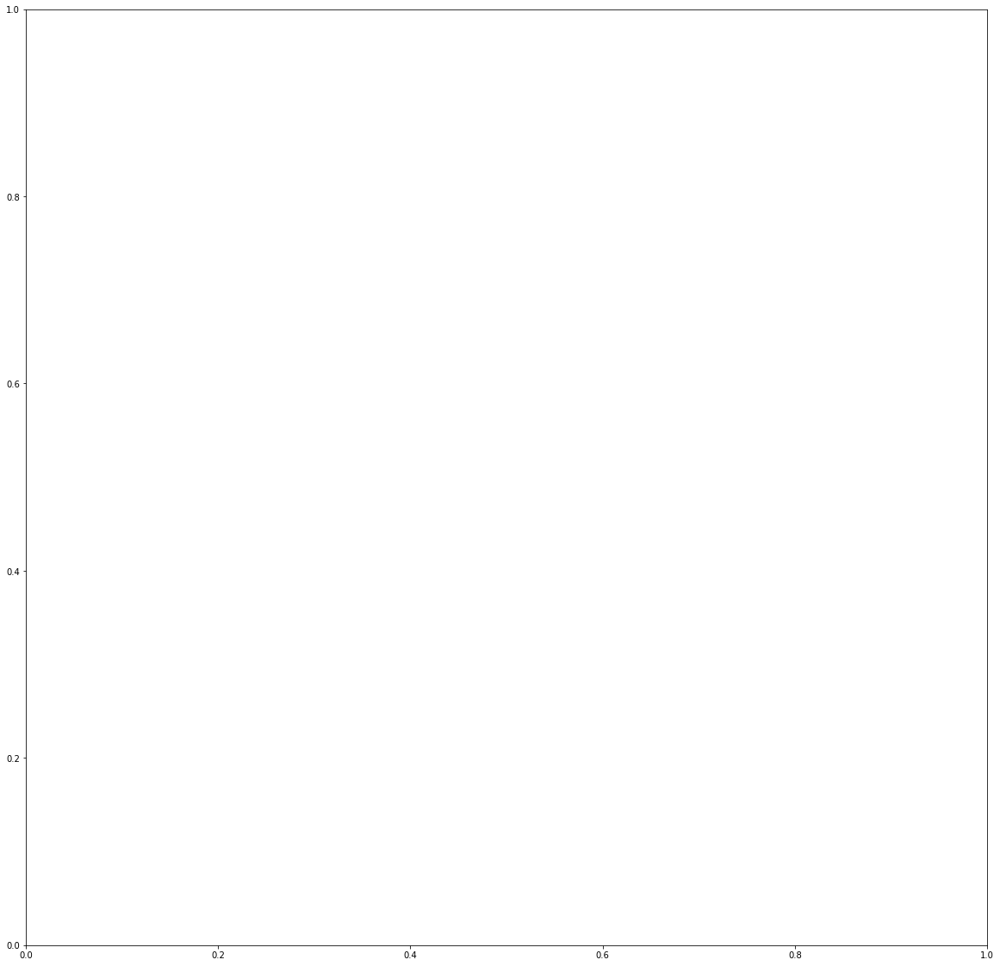

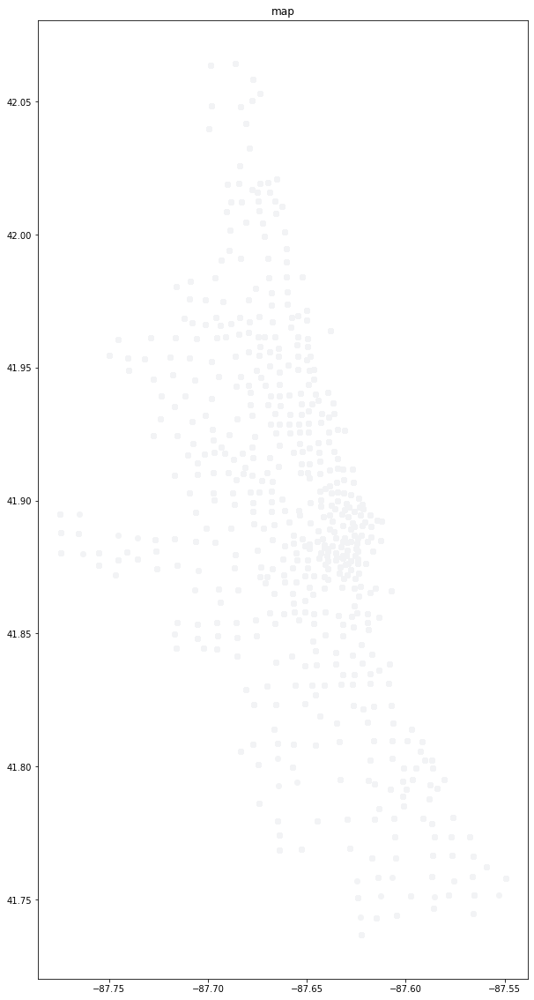

In [64]:
# Simple mapping to locate any outliers or anomalies
# Setting the fig, ax variables
fig, ax = plt.subplots(1, figsize=(20,20))

# Setting the fig, ax variables
fig, ax = plt.subplots(1, figsize=(20,20))

# Creating the map
map_1 = geo_locs_1.plot(ax=ax, figsize=fig, color='#f2f3f5')

# Displaying the mapgeo_locs_1.plot(ax=map_1, marker="o", markersize=10, alpha=0.3)
ax.set_title("map")
plt.show()

#### Check
The lat/lon plot looks like Chicago, continue to next steps.

# Additional Data

### Chicago CTA Open Data
- Chicago Open Data Portal: https://www.transitchicago.com/data/
- CTA - 'L' (Rail) Lines: https://data.cityofchicago.org/Transportation/CTA-L-Rail-Lines-kml/sgbp-qafc
- CTA - 'L' (Rail) Stations: https://data.cityofchicago.org/Transportation/CTA-L-Rail-Stations-kml/4qtv-9w43
- CTA - Bus Stops: https://data.cityofchicago.org/Transportation/CTA-Bus-Stops-kml/84eu-buny
- CTA - Bus Routes: https://data.cityofchicago.org/Transportation/CTA-Bus-Routes-kml/rytz-fq6y

### Steps
Export map from above link as .kml<br>
Convert .kml to .geojson with Mapbox tool<br>
https://github.com/mapbox/togeojson<br><br>
Commands to run<br/>
<code>npm install -g @mapbox/togeojson</code><br>
<code>togeojson Bicycle_Lanes.kml > Bicycle_Lanes.geojson</code><br>

<code>togeojson /Users/mari/git/cc/msc/maps/CTA_RailStations.kml > /Users/mari/git/cc/msc/maps/CTA_RailStations.geojson</code><br>
<code>togeojson /Users/mari/git/cc/msc/maps/CTA_BusStops.kml > /Users/mari/git/cc/msc/maps/CTA_BusStops.geojson</code><br>
<code>togeojson /Users/mari/git/cc/msc/maps/CTA_RailLines.kml > /Users/mari/git/cc/msc/maps/CTA_RailLines.geojson</code><br>
<code>togeojson /Users/mari/git/cc/msc/maps/CTA_BusRoutes.kml > /Users/mari/git/cc/msc/maps/CTA_BusRoutes.geojson</code><br>

In [65]:
# Ingest geojson
df_rail_stations = gpd.read_file(folder_maps + 'CTA_RailStations.geojson')
# Specifying CRS
df_rail_stations.crs = "EPSG:4326"

display(df_rail_stations.head(2))

,id,name,styleUrl,styleHash,description,fill,fill-opacity,stroke-opacity,geometry
0,ID_00001,35-Bronzeville-IIT,#IconStyle01,-28aff40d,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...",#000000,1,0,POINT Z (-87.62588 41.83168 0.00000)
1,ID_00002,Granville,#IconStyle01,-28aff40d,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...",#000000,1,0,POINT Z (-87.65920 41.99366 0.00000)


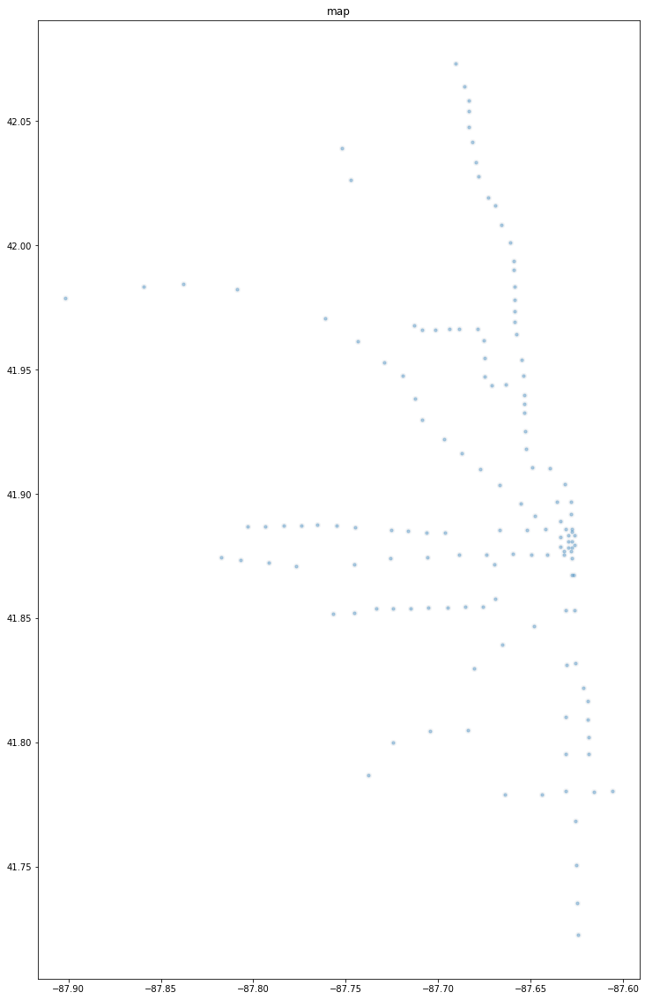

In [66]:
# Simple mapping to locate any outliers or anomalies
# Setting the fig, ax variables
fig, ax = plt.subplots(1, figsize=(20,20))

# Creating the map
map_rail_stations = df_rail_stations.plot(ax=ax, figsize=fig, color='#f2f3f5')

# Displaying the map
df_rail_stations.plot(ax=map_rail_stations, marker="o", markersize=10, alpha=0.3)
ax.set_title("map")
plt.show()

In [69]:
# Ingest geojson
df_bus_routes = gpd.read_file(folder_maps + 'CTA_BusRoutes.geojson')
# Specifying CRS
df_bus_routes.crs = "EPSG:4326"

display(df_bus_routes.head(2))

,id,name,styleUrl,styleHash,description,stroke,stroke-opacity,stroke-width,fill,fill-opacity,geometry
0,ID_00001,68,#LineStyle01,54b945be,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...",#ff0000,0,1,#000000,0,GEOMETRYCOLLECTION Z (LINESTRING Z (-87.80668 ...
1,ID_00002,165,#LineStyle01,54b945be,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...",#ff0000,0,1,#000000,0,GEOMETRYCOLLECTION Z (LINESTRING Z (-87.74243 ...


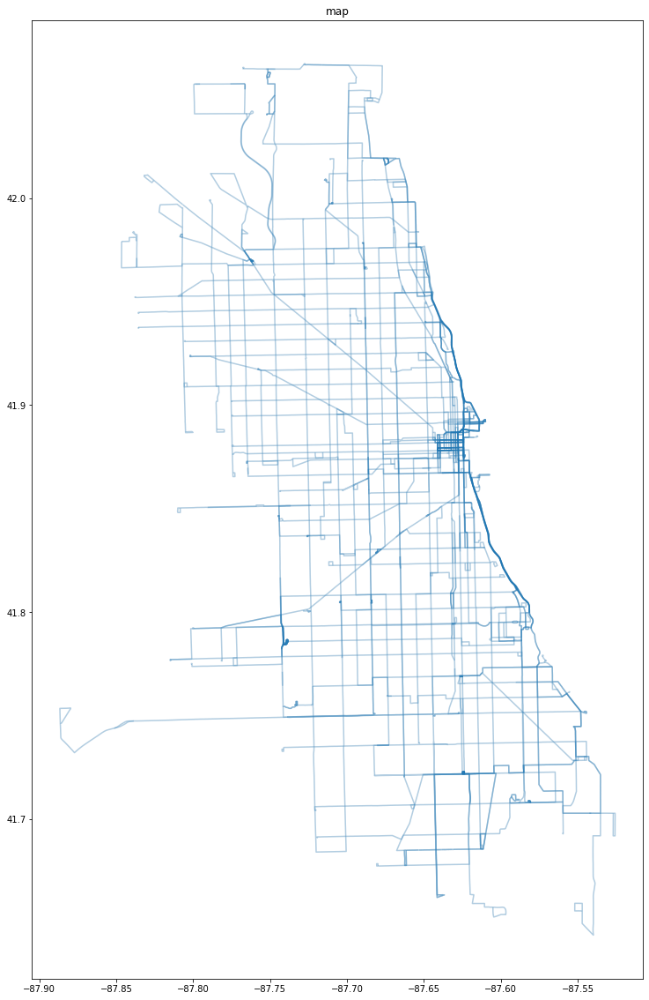

In [70]:
# Simple mapping to locate any outliers or anomalies
# Setting the fig, ax variables
fig, ax = plt.subplots(1, figsize=(20,20))

# Creating the map
map_bus_routes = df_bus_routes.plot(ax=ax, figsize=fig, color='#f2f3f5')

# Displaying the map
df_bus_routes.plot(ax=map_bus_routes, alpha=0.3)
ax.set_title("map")
plt.show()

In [73]:
# Ingest geojson
df_rail_lines = gpd.read_file(folder_maps + 'CTA_RailLines.geojson')
# Specifying CRS
df_rail_lines.crs = "EPSG:4326"

display(df_rail_lines.head(2))

,name,stroke,stroke-opacity,fill-opacity,ASSET_ID,SHAPE.LEN,OBJECTID_1,DESCRIPTIO,LINES,ALT_LEGEND,BRANCH,TYPE,LEGEND,Field_1,geometry
0,"Red, Purple Line",#ff0000,1,0,21100002,1800.132896,2,Lawrence to Wilson,"Red, Purple Line",RDPR,Red Line North Side,Elevated or at Grade,RD,"Red, Purple Line","LINESTRING (-87.65759 41.96427, -87.65802 41.9..."
1,"Red, Purple Line",#ff0000,1,0,21100003,4256.243677,3,Wilson to Sheridan,"Red, Purple Line",RDPR,Red Line North Side,Elevated or at Grade,RD,"Red, Purple Line","LINESTRING (-87.65493 41.95377, -87.65557 41.9..."


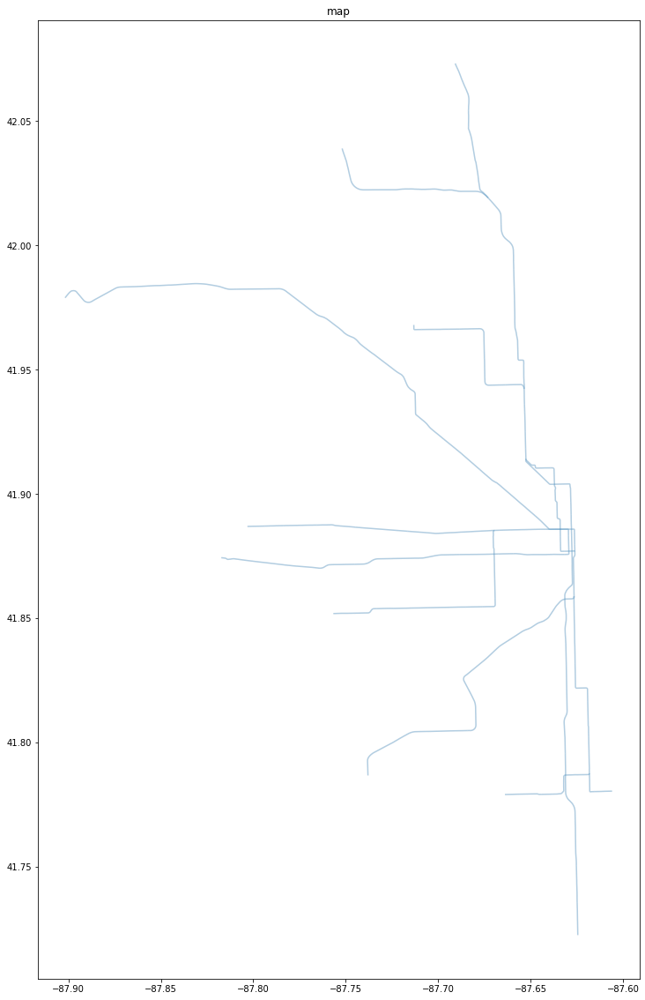

In [74]:
# Simple mapping to locate any outliers or anomalies
# Setting the fig, ax variables
fig, ax = plt.subplots(1, figsize=(20,20))

# Creating the map
map_rail_lines = df_rail_lines.plot(ax=ax, figsize=fig, color='#f2f3f5')

# Displaying the map
df_rail_lines.plot(ax=map_rail_lines, alpha=0.3)
ax.set_title("map")
plt.show()

In [75]:
# Ingest geojson
df_bus_stops = gpd.read_file(folder_maps + 'CTA_BusStops.geojson')
# Specifying CRS
df_bus_stops.crs = "EPSG:4326"

display(df_bus_stops.head(2))

,id,name,styleUrl,styleHash,description,fill,fill-opacity,stroke-opacity,geometry
0,ID_00001,Taylor & Throop,#IconStyle01,3719148a,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...",#000000,1,0,POINT Z (-87.65929 41.86931 0.00000)
1,ID_00002,Jackson & Karlov,#IconStyle01,3719148a,"<html xmlns:fo=""http://www.w3.org/1999/XSL/For...",#000000,1,0,POINT Z (-87.72781 41.87701 0.00000)


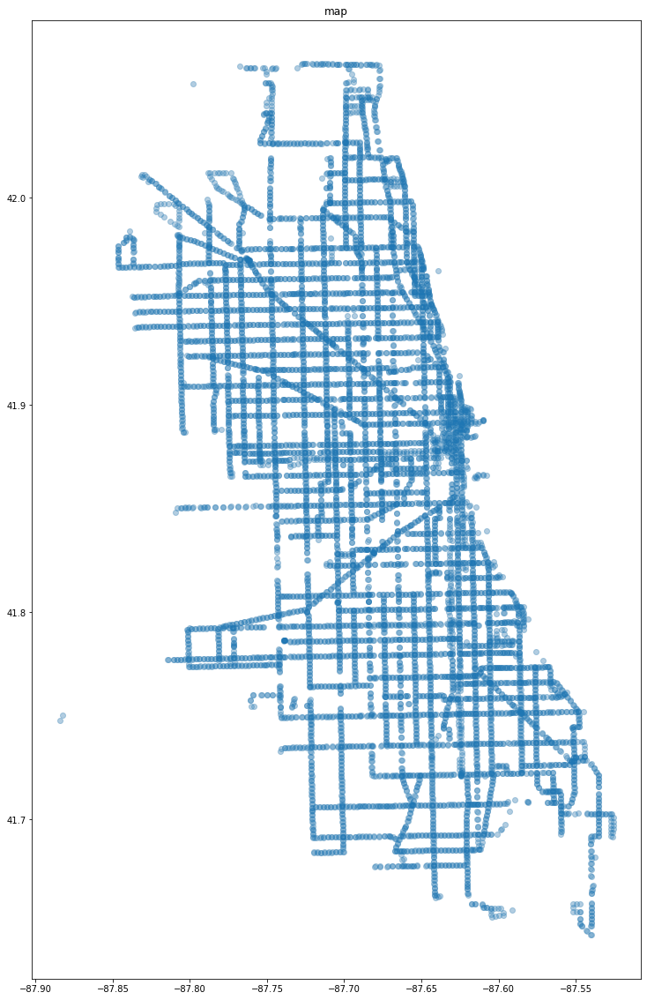

In [76]:
# Simple mapping to locate any outliers or anomalies
# Setting the fig, ax variables
fig, ax = plt.subplots(1, figsize=(20,20))

# Creating the map
map_bus_stops = df_bus_stops.plot(ax=ax, figsize=fig, color='#f2f3f5')

# Displaying the map
df_bus_stops.plot(ax=map_bus_stops, alpha=0.3)
ax.set_title("map")
plt.show()

# Kepler Mapping MSC Trips, Stations, Weather Along with CTA Rail & Bus

In [77]:
# Checking record count
print(len(geo_locs_1))

346399


In [78]:
# load the config, assumes saved from previous, if none exists yet, skip next % step
%run base_config.py

#Initiate a new map with the data
dict_data_1 = {'msc_trips_stations_weather': geo_locs_1, 'msc_stations': df_stations, 'cta_rail_stations':df_rail_stations, 'cta_bus_routes': df_bus_routes, 'cta_rail_lines': df_rail_lines, 'cta_bus_stops': df_bus_stops}
map_1 = KeplerGl(height=800, data=dict_data_1, config=config)

# Show the map
map_1

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(config={'version': 'v1', 'config': {'visState': {'filters': [], 'layers': [{'id': '7xbhs8', 'type': '…

<Figure size 432x288 with 0 Axes>

In [79]:
# Save map_1 config to a file
with open('base_config.py', 'w') as f:
   f.write('config = {}'.format(map_1.config))

# load the config
%run base_config.py

To export as HTML so you can view in your browser at full screen (for more interactivity), use below

In [80]:
# Saves map with data and config
#map_1.save_to_html(data=dict_data_1, config=config, file_name='trip_starts_by_vol_dur.html')

# Data Visualization in Tableau

In [81]:
df_trips_stations_weather.to_csv(folder_tableau + 'msc_trips_stations_weather.csv')

In [83]:
df_stations.to_csv(folder_tableau + 'msc_stations.csv')